In [1]:
import numpy as np
import pandas as pd

In [2]:
data = pd.read_csv("Search.csv")

In [3]:
import numpy as np
import pandas as pd

import requests
from bs4 import BeautifulSoup

from PIL import Image
from wordcloud import WordCloud, ImageColorGenerator
import matplotlib.pyplot as plt

import string
import nltk
from nltk.corpus import stopwords

In [4]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to C:\Users\Andrés
[nltk_data]     Dardex\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [5]:
punctuation=[]
for s in string.punctuation:
    punctuation.append(str(s))
sp_punctuation = ["¿", "¡", "“", "”", "…", ":", "–", "»", "«"]    

punctuation += sp_punctuation

In [6]:
titulos = str
for titulo in data["Abstract"]:
    titulos = titulo + " " + str(titulos)
titulos

'Presenting the police suspect alongside similar-looking people (a lineup) results in more accurate eyewitness identification decisions than presenting the suspect alone (a showup). Why are lineups better than showups? Diagnostic-feature-detection theory suggests that lineups enhance witnesses’ ability to discriminate between innocent and guilty suspects, because facial features can be compared across lineup members. Filler-siphoning suggests that the presence of other lineup members siphons some of the incorrect identifications that would otherwise land on the innocent suspect. To test these 2 accounts, over 3,600 subjects across 3 experiments watched a mock-crime video and were presented with either a showup, a simultaneous lineup, or a simultaneous showup (a novel procedure). Subjects in the simultaneous showup condition saw the suspect and 5 similar-looking faces, but, unlike a lineup, could not identify the other faces. Presenting similar-looking faces alongside the suspect (simul

In [7]:
stop_words = stopwords.words('english')

In [8]:
for p in punctuation:
    clean_texto = titulos.lower().replace(p,"")
    
for p in punctuation:
    clean_texto = clean_texto.replace(p,"")


In [9]:
for stop in stop_words:
    clean_texto_list = clean_texto.split()
    clean_texto_list = [i.strip() for i in clean_texto_list]
    try:
        while stop in clean_texto_list: clean_texto_list.remove(stop)
    except:
        print("Error")
        pass
    clean_texto= " ".join(clean_texto_list)

In [10]:
lista_texto = clean_texto.split(" ")

palabras = []

for palabra in lista_texto:
    if (len(palabra)>=3 and len(palabra)<18):
        palabras.append(palabra)

In [11]:
word_count={}
for palabra in palabras:
    if palabra in word_count.keys():
        word_count[palabra][0]+=1
    else:
        word_count[palabra]=[1]
 

In [17]:
df = pd.DataFrame.from_dict(word_count).transpose()
df.columns=["freq"]
df.sort_values(["freq"], ascending=False, inplace=True)
df.head(20)

,freq
facial,14926
recognition,13625
face,12036
results,6378
faces,5488
emotion,5457
using,5447
study,5435
patients,5188
data,4591


In [13]:
def plot_bar(data=df, top=5):    
    fig = plt.figure()
    ax = fig.add_axes([0,0,2,1])
    ax.bar(x =df.iloc[:top,:].index, height = df.iloc[:top,0].values)
    plt.show()

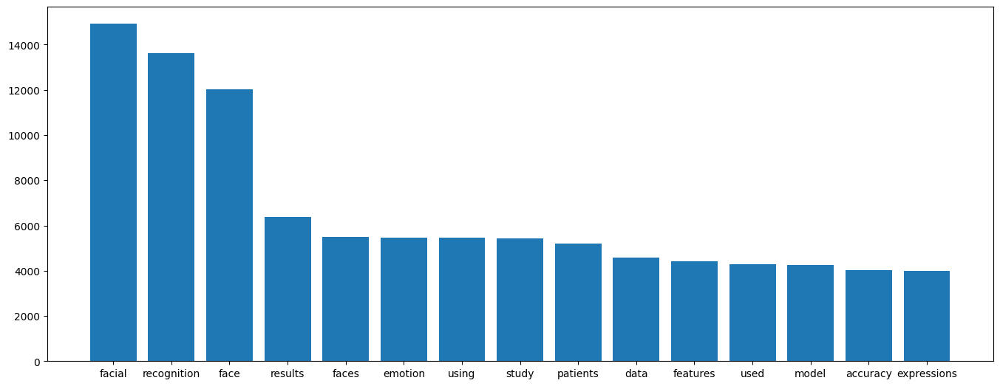

In [14]:
plot_bar(data=df, top=15)

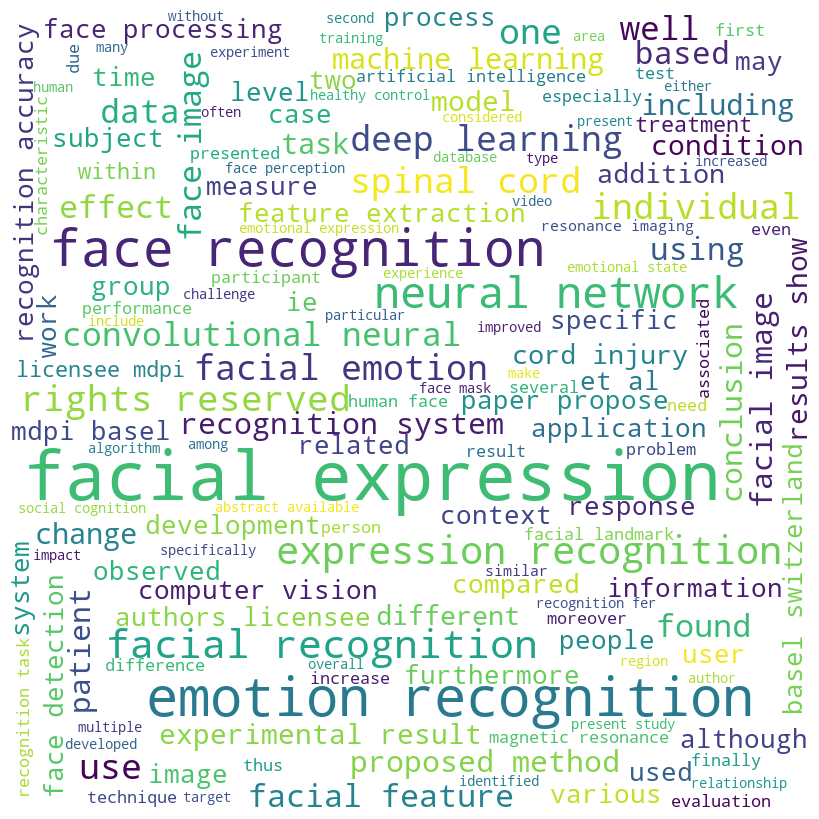

In [15]:
word_cloud = WordCloud(height=800, width=800, background_color='white',max_words=150, min_font_size=5, collocation_threshold=10).generate(clean_texto)
word_cloud.to_file("n1.png") 
plt.figure(figsize=(10,8))
plt.imshow(word_cloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [19]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

In [36]:
top_words = df.head(20).index.tolist()

# Clusterización de palabras clave
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(top_words)

k = 3  # Número de clusters
kmeans = KMeans(n_clusters=k)
kmeans.fit(X)

# Obtener las palabras clave más representativas de cada cluster
top_keywords_per_cluster = []
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names_out()

for i in range(k):
    cluster_keywords = [terms[ind] for ind in order_centroids[i, :]]  # Seleccionar todas las palabras clave del cluster
    top_keywords_per_cluster.append(cluster_keywords)

# Construir consulta de búsqueda
search_query = " ".join(top_words[:3])  # Incluir las 3 palabras más repetidas

# Añadir palabras clave representativas de cada cluster sin repetir
added_keywords = set()
for keywords in top_keywords_per_cluster:
    for keyword in keywords:
        if keyword not in added_keywords:
            search_query += " " + keyword
            added_keywords.add(keyword)
        if len(added_keywords) >= 5:  # Limitar el número total de palabras clave agregadas
            break

print("Search Query:")
print(search_query)

Search Query:
facial recognition face using images authors data emotion faces used


In [21]:
df.head(20)

,freq
facial,14926
recognition,13625
face,12036
results,6378
faces,5488
emotion,5457
using,5447
study,5435
patients,5188
data,4591
